## Imports

In [2]:
import os
current_file_dir = os.getcwd()
os.chdir("../../codes/")

from src.load_explanations import load_explanations_of_many_models, _unify_lenths, _trim_image_path
from src import strings_to_classes_mappings

from src.compare_explanations import compare_explanations, cosine_similarity_distance_with_stdev_and_mean, radial_basis_function_distance_with_stdev_and_mean
from src.load_explanations import load_explanations_of_many_models

os.chdir(current_file_dir)

# Usage example

Get possible models etc.

In [3]:
print("Possible datasets:", list(strings_to_classes_mappings.datasets_mapping.keys()))
print("Possible models:", list(strings_to_classes_mappings.models_mapping.keys()))
print("Possible explanations:", list(strings_to_classes_mappings.explanations_mapping.keys()))
models_list = list(strings_to_classes_mappings.models_mapping.keys())

Possible datasets: ['imagenette2']
Possible models: ['ConvNeXtV2_Nano', 'DeiT_S', 'DeiT_T', 'DenseNet121', 'EfficientNet_B3', 'EfficientNet_B4', 'MobileNetV3', 'PyramidViT_V2_B2', 'Res2Net50', 'ResNet18', 'ResNet50', 'ResNeXt50', 'Swin_T', 'ViT_B_32']
Possible explanations: ['GradCAM', 'IntegratedGradients', 'KernelSHAP']


# Loading data

In [4]:
import os
current_file_dir = os.getcwd()
os.chdir("../../codes/")
from src.utils import models_to_architecture_mapping
os.chdir(current_file_dir)

In [5]:
similarity_matriced_csvs = [f for f in os.listdir('.') if f.endswith('.csv') and f.startswith('dissimilarity_matrix')]
similarity_matriced_csvs

['dissimilarity_matrix_gradcam_cosine.csv',
 'dissimilarity_matrix_gradcam_rbf.csv',
 'dissimilarity_matrix_integratedgradients_cosine.csv',
 'dissimilarity_matrix_integratedgradients_rbf.csv',
 'dissimilarity_matrix_kernelshap_cosine.csv',
 'dissimilarity_matrix_kernelshap_rbf.csv']

## Heatmaps of dissimilarities

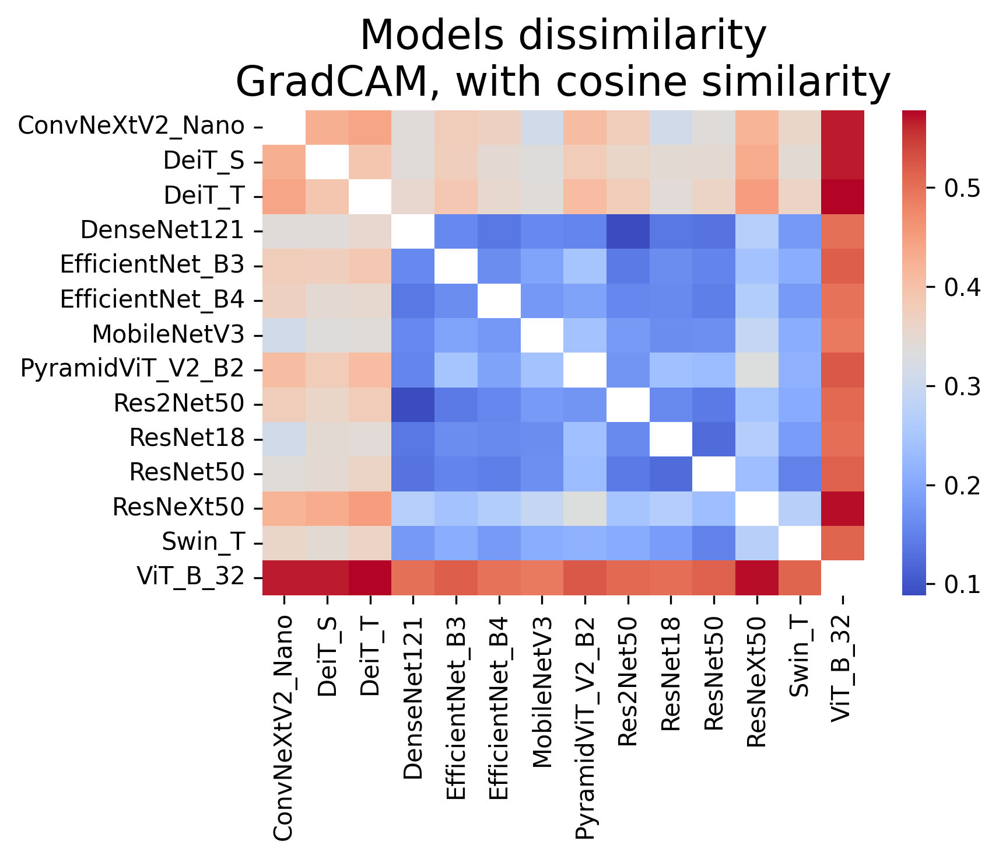

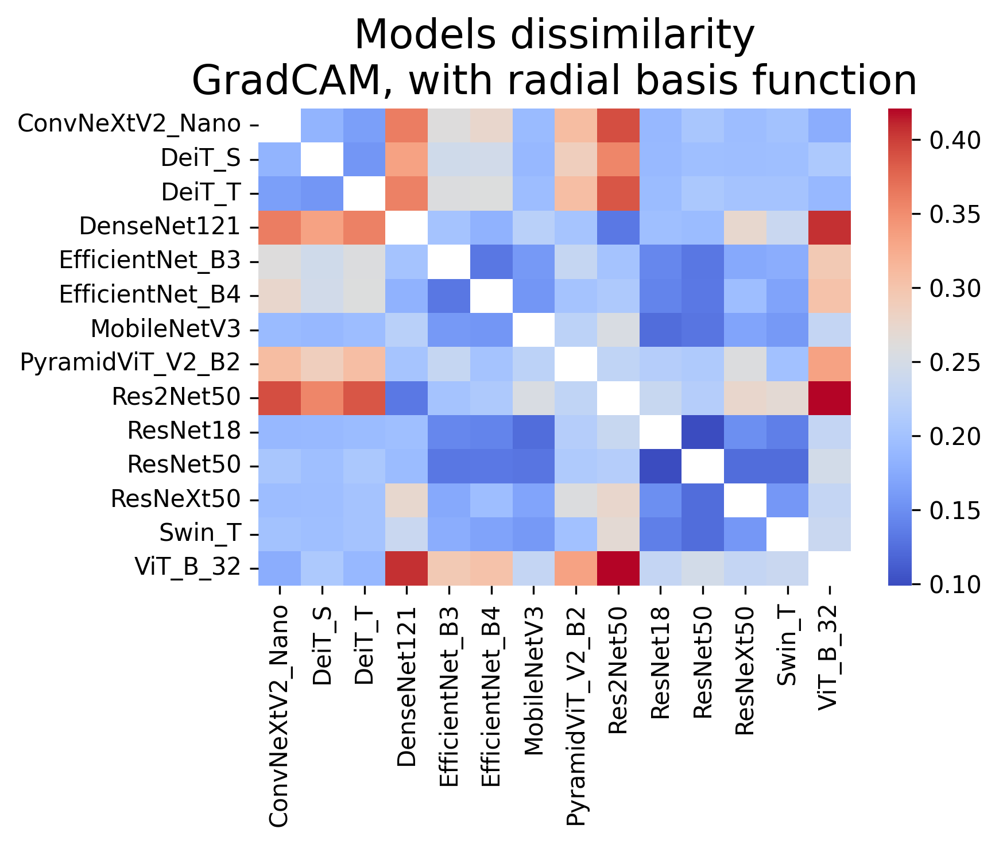

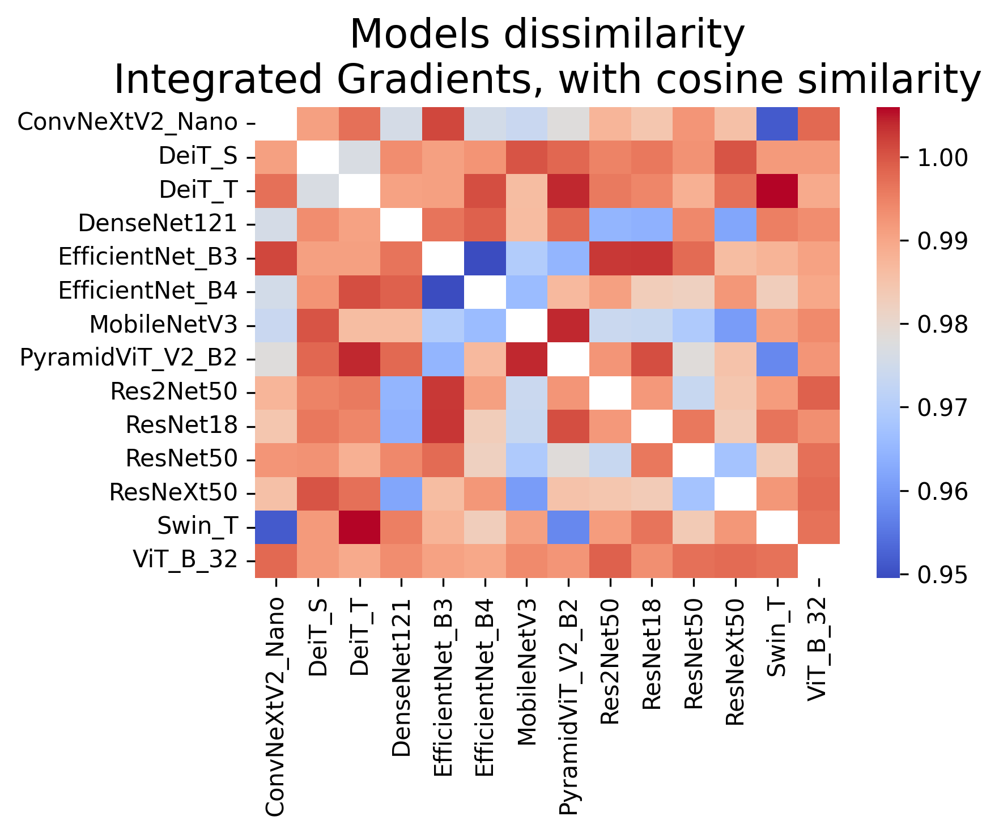

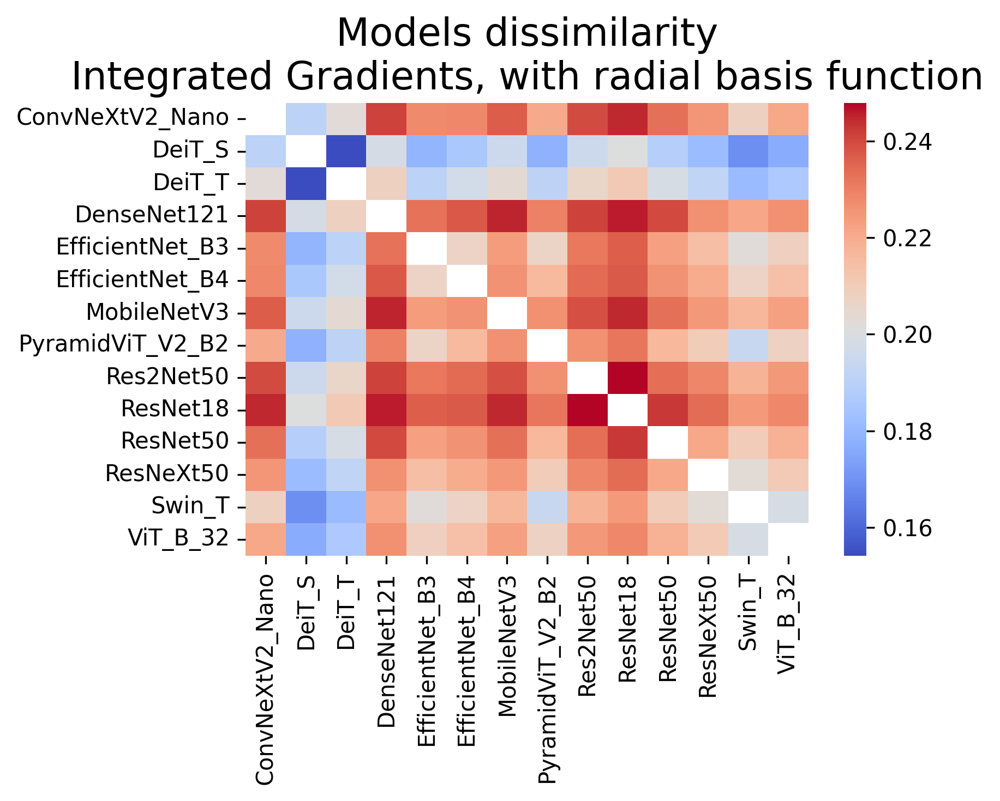

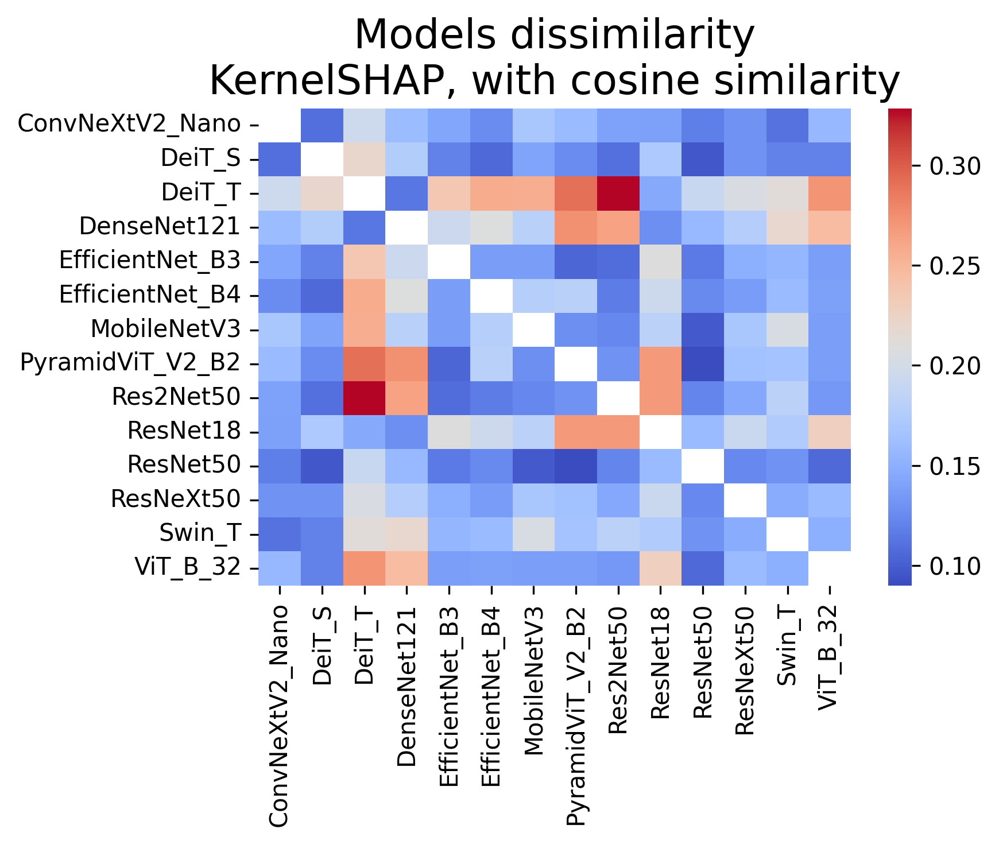

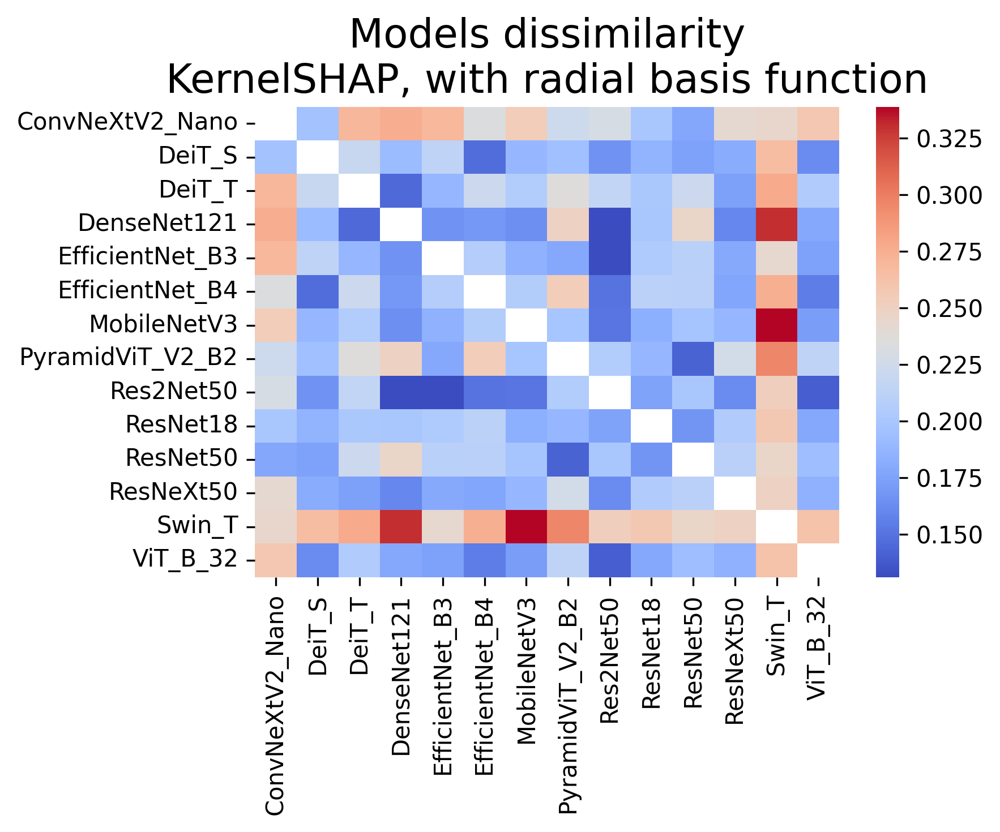

In [51]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# plot heatmap
def plot_heatmap(df, title, output_filename):
    mask = np.eye(df.shape[0], dtype=bool)
    fig, ax = plt.subplots(figsize=(6, 5), dpi=300)
    sns.heatmap(df, mask=mask, cmap='coolwarm', ax=ax)
    plt.title(title, fontsize=17)
    plt.tight_layout()
    plt.savefig(output_filename)
    plt.show()

explanation_name_mapping = {
    'integratedgradients': 'Integrated Gradients',
    'gradcam': 'GradCAM',
    'kernelshap': 'KernelSHAP',
}
dissimilarity_name_mapping = {
    'cosine': 'cosine similarity',
    'rbf': 'radial basis function',
}

# for csv_name in similarity_matriced_csvs:
#     splitted = csv_name.split('_')
#     explanation_method, similarity_metric = splitted[2], splitted[3].split('.')[0]
#     title = f"Graph community detection - Louvain\n{explanation_name_mapping[explanation_method]}, {similarity_name_mapping[similarity_metric]}"
    

for csv_name in similarity_matriced_csvs:
    splitted = csv_name.split('_')
    explanation_method, similarity_metric = splitted[2], splitted[3].split('.')[0]
    title = f"Models dissimilarity\n{explanation_name_mapping[explanation_method]}, with {dissimilarity_name_mapping[similarity_metric]}"
    if "only_matching" in csv_name:
        title += ", only matching predictions"
    df = pd.read_csv(csv_name, index_col=0)
    plot_heatmap(df, title=title, output_filename=f"heatmap_{explanation_method}_{similarity_metric}.png")

# Community detection - Louvain

In [21]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_partitions, louvain_communities

df = 1 - pd.read_csv(similarity_matriced_csvs[3], index_col=0)

# Remove diagonal and create graph
np.fill_diagonal(df.values, 0)
G = nx.from_pandas_adjacency(df)
df

,ConvNeXtV2_Nano,DeiT_S,DeiT_T,DenseNet121,EfficientNet_B3,EfficientNet_B4,MobileNetV3,PyramidViT_V2_B2,Res2Net50,ResNet18,ResNet50,ResNeXt50,Swin_T,ViT_B_32
ConvNeXtV2_Nano,0.000000,0.809268,0.797309,0.758715,0.772036,0.771754,0.763442,0.779293,0.760488,0.755263,0.766789,0.774633,0.791752,0.779169
DeiT_S,0.809268,0.000000,0.845791,0.801816,0.820761,0.814278,0.804681,0.821845,0.804611,0.799020,0.811180,0.818470,0.830819,0.823384
DeiT_T,0.797309,0.845791,0.000000,0.791856,0.809438,0.802801,0.796293,0.809131,0.793918,0.788997,0.801380,0.808267,0.818931,0.813771
DenseNet121,0.758715,0.801816,0.791856,0.000000,0.767407,0.762500,0.754894,0.770263,0.758970,0.754208,0.759814,0.773541,0.778476,0.773553
EfficientNet_B3,0.772036,0.820761,0.809438,0.767407,0.000000,0.792849,0.776235,0.793154,0.768246,0.763592,0.777142,0.785322,0.797649,0.791543
EfficientNet_B4,0.771754,0.814278,0.802801,0.762500,0.792849,0.000000,0.773933,0.784177,0.765781,0.762814,0.773893,0.780103,0.792887,0.785787
MobileNetV3,0.763442,0.804681,0.796293,0.754894,0.776235,0.773933,0.000000,0.773449,0.761123,0.755339,0.767044,0.775434,0.783137,0.777091
PyramidViT_V2_B2,0.779293,0.821845,0.809131,0.770263,0.793154,0.784177,0.773449,0.000000,0.773661,0.767948,0.783529,0.790173,0.806130,0.792257
Res2Net50,0.760488,0.804611,0.793918,0.758970,0.768246,0.765781,0.761123,0.773661,0.000000,0.752122,0.766699,0.771295,0.781995,0.775179
ResNet18,0.755263,0.799020,0.788997,0.754208,0.763592,0.762814,0.755339,0.767948,0.752122,0.000000,0.757350,0.766366,0.775802,0.771689


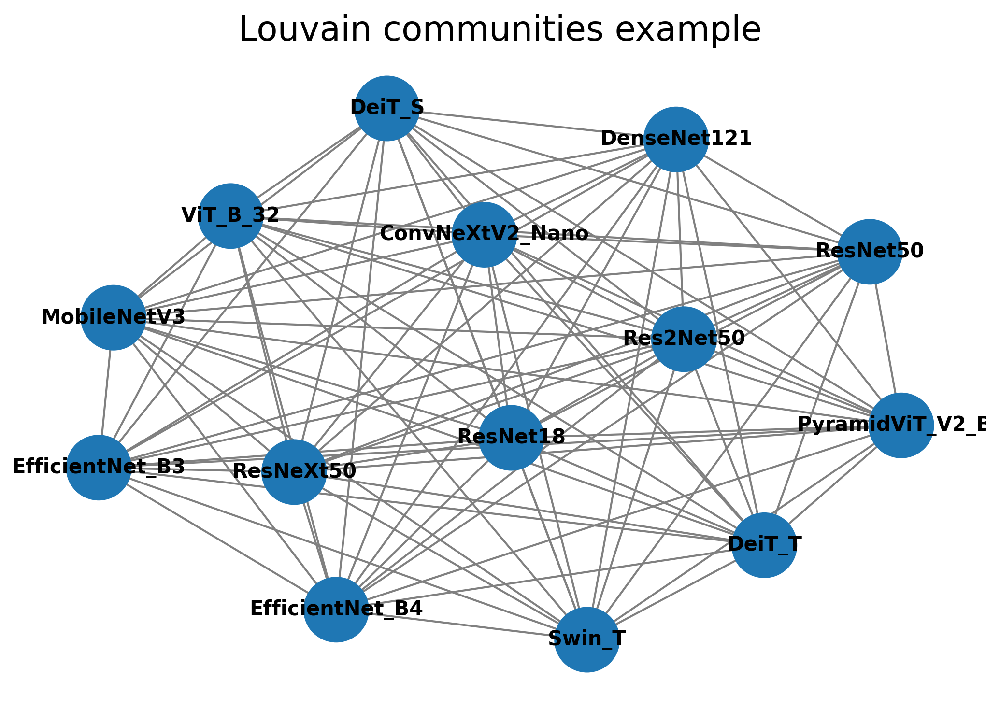

[{'ConvNeXtV2_Nano',
  'DeiT_S',
  'DeiT_T',
  'DenseNet121',
  'EfficientNet_B3',
  'EfficientNet_B4',
  'MobileNetV3',
  'PyramidViT_V2_B2',
  'Res2Net50',
  'ResNeXt50',
  'ResNet18',
  'ResNet50',
  'Swin_T',
  'ViT_B_32'}]

In [43]:
def plot_communities(communities, title, output_filename=None):

    node_colors = {}
    for i, community in enumerate(communities):
        for node in community:
            node_colors[node] = i

    colors = [node_colors[node] for node in G.nodes]
    plt.figure(figsize=(7,5), dpi=300)
    ax = plt.gca()
    ax.set_title(title, fontsize=17)
    nx.draw(G, node_color=colors, with_labels=True, cmap=plt.cm.tab20, node_size=1000, font_size=10, font_color='black', edge_color='gray', font_weight='bold', ax=ax)
    _ = ax.axis('off')
    plt.tight_layout()
    if output_filename:
        plt.savefig(output_filename)
    plt.show()


communities = louvain_communities(G)
plot_communities(communities, title="Louvain communities example")
communities

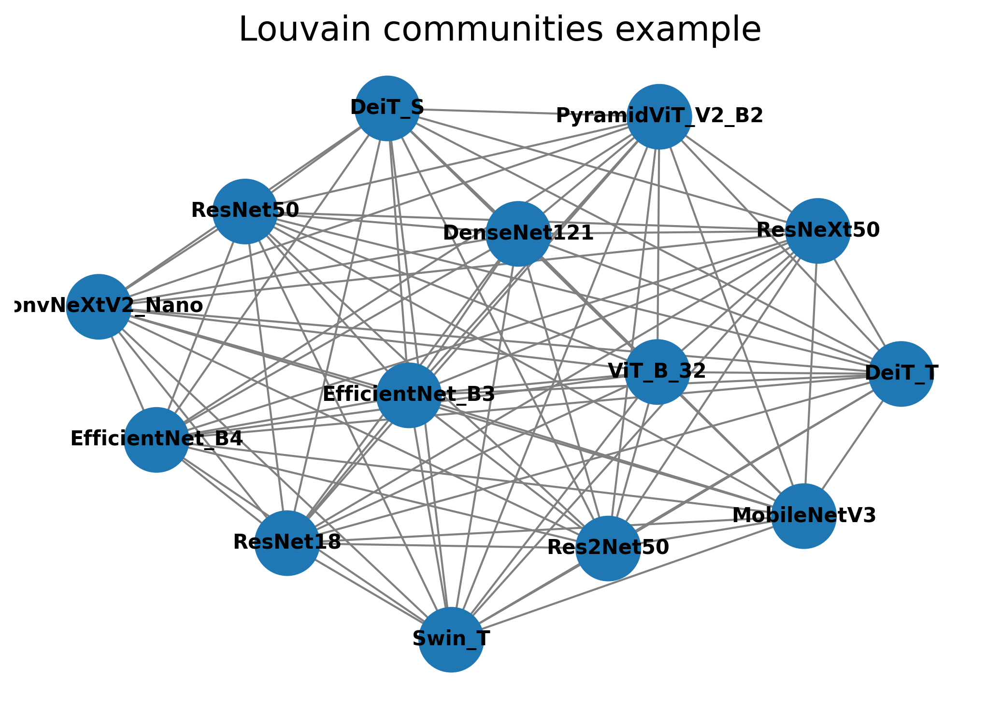

[[{'ConvNeXtV2_Nano',
   'DeiT_S',
   'DeiT_T',
   'DenseNet121',
   'EfficientNet_B3',
   'EfficientNet_B4',
   'MobileNetV3',
   'PyramidViT_V2_B2',
   'Res2Net50',
   'ResNeXt50',
   'ResNet18',
   'ResNet50',
   'Swin_T',
   'ViT_B_32'}]]

In [44]:
communities = list(louvain_partitions(G))
for c in communities:
    plot_communities(c, title="Louvain communities example")
communities

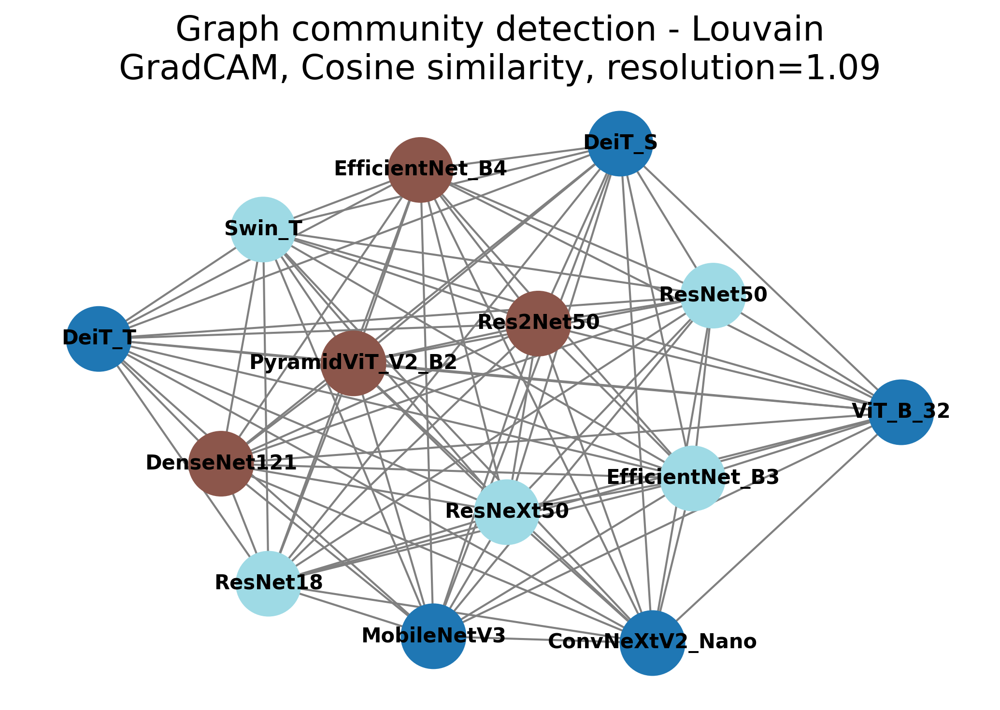

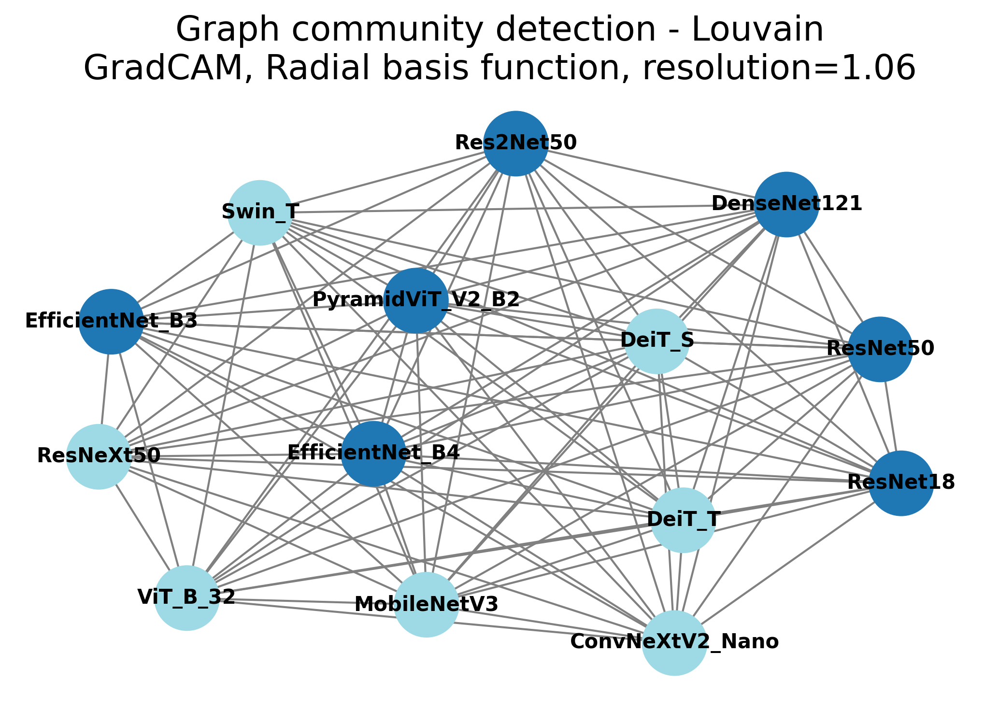

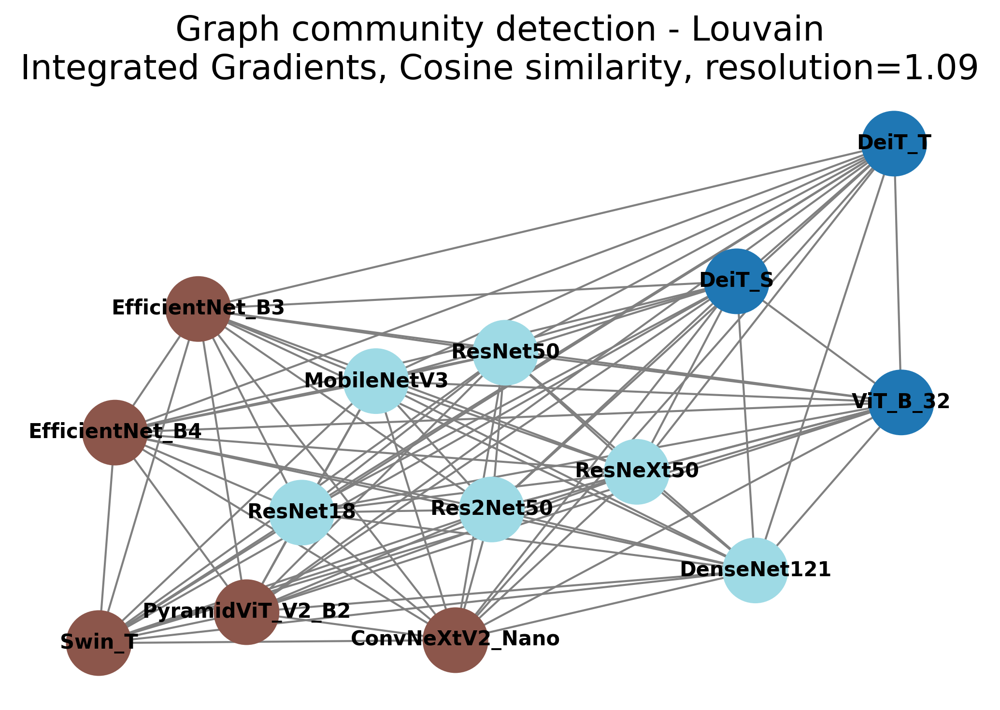

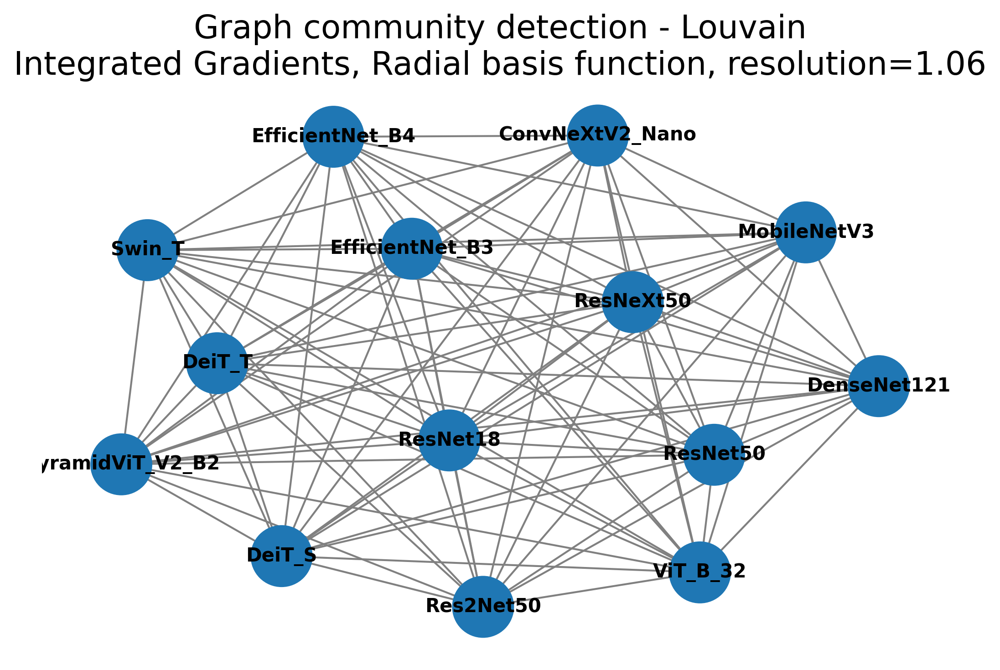

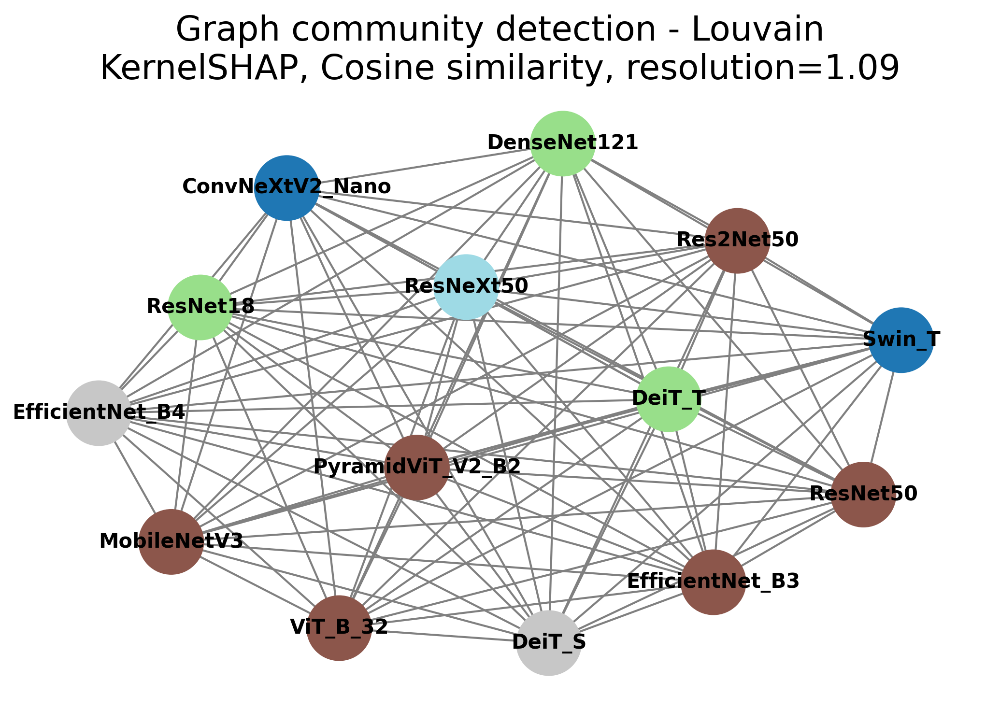

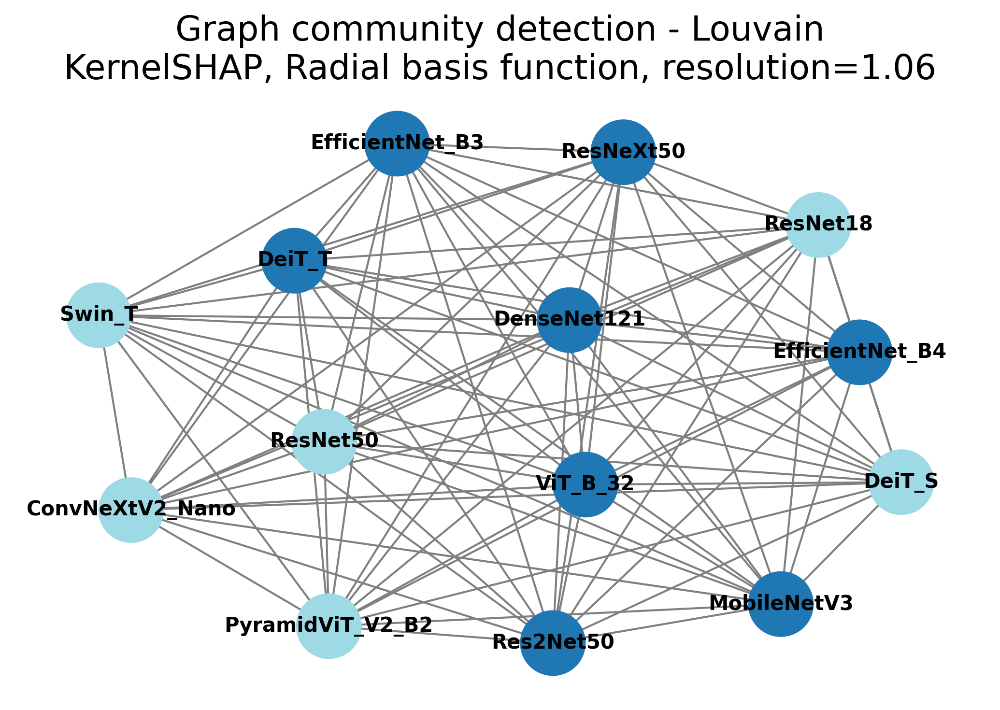

In [48]:
explanation_name_mapping = {
    'integratedgradients': 'Integrated Gradients',
    'gradcam': 'GradCAM',
    'kernelshap': 'KernelSHAP',
}
similarity_name_mapping = {
    'cosine': 'Cosine similarity',
    'rbf': 'Radial basis function',
}

for csv_name in similarity_matriced_csvs:
    splitted = csv_name.split('_')
    explanation_method, similarity_metric = splitted[2], splitted[3].split('.')[0]
    title = f"Graph community detection - Louvain\n{explanation_name_mapping[explanation_method]}, {similarity_name_mapping[similarity_metric]}"
    if "only_matching" in csv_name:
        title += ", only matching predictions"
        output_filename = f'graph_louvain_{explanation_method}_{similarity_metric}_only_matching.png'
    else:
        output_filename = f'graph_louvain_{explanation_method}_{similarity_metric}_all.png'

    if similarity_metric == 'cosine':
        resolution = 1.09
    else:
        resolution = 1.06

    # loaded as dissimilarity, so we invert it to similarity by substracting it from 1
    df = 1 - pd.read_csv(csv_name, index_col=0)
    np.fill_diagonal(df.values, 0)
    G = nx.from_pandas_adjacency(df)
    communities = louvain_communities(G, resolution=resolution)
    plot_communities(communities, title=title + f", resolution={resolution}", output_filename=output_filename)


# Hierarchical clustering

In [28]:
# loaded as dissimilarity, so we invert it to similarity by substracting it from 1
df = 1 - pd.read_csv(similarity_matriced_csvs[0], index_col=0)
np.fill_diagonal(df.values, 1)
df

,ConvNeXtV2_Nano,DeiT_S,DeiT_T,DenseNet121,EfficientNet_B3,EfficientNet_B4,MobileNetV3,PyramidViT_V2_B2,Res2Net50,ResNet18,ResNet50,ResNeXt50,Swin_T,ViT_B_32
ConvNeXtV2_Nano,1.000000,0.571405,0.558074,0.660057,0.623650,0.628667,0.689069,0.592454,0.624571,0.687956,0.662383,0.580164,0.640967,0.432035
DeiT_S,0.571405,1.000000,0.608372,0.659726,0.624741,0.652760,0.663448,0.620521,0.641458,0.654025,0.652223,0.569117,0.654704,0.432490
DeiT_T,0.558074,0.608372,1.000000,0.647511,0.611138,0.647854,0.661732,0.590984,0.619821,0.657789,0.636399,0.548388,0.634972,0.421956
DenseNet121,0.660057,0.659726,0.647511,1.000000,0.840813,0.861108,0.840951,0.846305,0.911341,0.861079,0.867367,0.730161,0.819927,0.499147
EfficientNet_B3,0.623650,0.624741,0.611138,0.840813,1.000000,0.834972,0.805741,0.754312,0.858044,0.835575,0.847382,0.756790,0.792513,0.482793
EfficientNet_B4,0.628667,0.652760,0.647854,0.861108,0.834972,1.000000,0.821725,0.807836,0.843002,0.839836,0.853911,0.734750,0.818896,0.501704
MobileNetV3,0.689069,0.663448,0.661732,0.840951,0.805741,0.821725,1.000000,0.756744,0.818323,0.835934,0.833003,0.706989,0.792746,0.509490
PyramidViT_V2_B2,0.592454,0.620521,0.590984,0.846305,0.754312,0.807836,0.756744,1.000000,0.825818,0.761039,0.769647,0.666679,0.783655,0.476123
Res2Net50,0.624571,0.641458,0.619821,0.911341,0.858044,0.843002,0.818323,0.825818,1.000000,0.840604,0.858127,0.753679,0.795253,0.492530
ResNet18,0.687956,0.654025,0.657789,0.861079,0.835575,0.839836,0.835934,0.761039,0.840604,1.000000,0.875819,0.732442,0.817374,0.496575


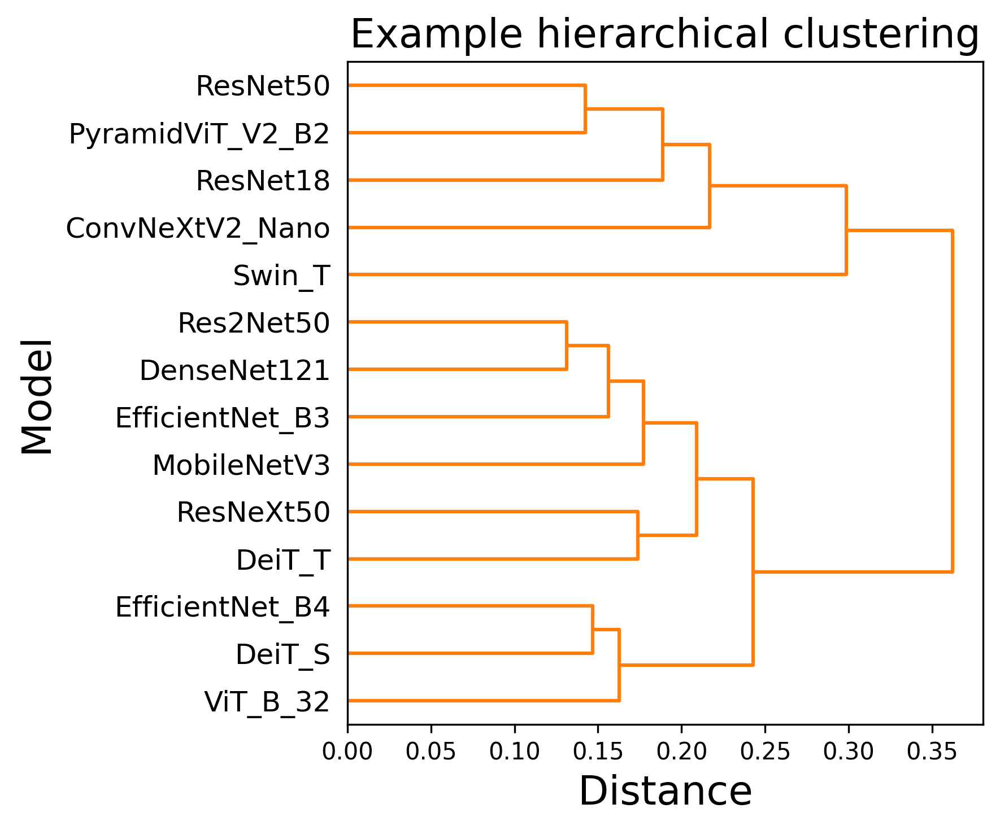

,cluster
ConvNeXtV2_Nano,0
PyramidViT_V2_B2,0
ResNet18,0
ResNet50,0
DeiT_S,1
DeiT_T,1
DenseNet121,1
EfficientNet_B3,1
EfficientNet_B4,1
MobileNetV3,1


In [40]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import dendrogram, linkage, cut_tree

def hierarchical_clustering(df, title, output_filename=None, color_threshold=1.04):
    similarity_matrix = df.values
    # convert similarity to distance again
    distance_matrix = 1 - similarity_matrix
    # set diagonal to 0
    condensed_dist_matrix = squareform(distance_matrix)
    Z = linkage(condensed_dist_matrix, method='ward')
    plt.figure(figsize=(6, 5), dpi=300)
    dendrogram(Z, labels=df.index, orientation='right', color_threshold=color_threshold) # threshold here matches 3 clusters
    plt.title(title, fontsize=17)
    plt.ylabel('Model', fontsize=17)
    plt.xlabel('Distance', fontsize=17)
    plt.tight_layout()
    if output_filename:
        plt.savefig(output_filename)
    plt.show()
    
    # clusters
    clusters = cut_tree(Z, n_clusters=3)
    clusters_df = pd.DataFrame(clusters, index=df.index, columns=['cluster'])
    clusters_df = clusters_df.sort_values(by='cluster')
    
    return Z, clusters_df

Z, clusters = hierarchical_clustering(df, title="Example hierarchical clustering")
clusters


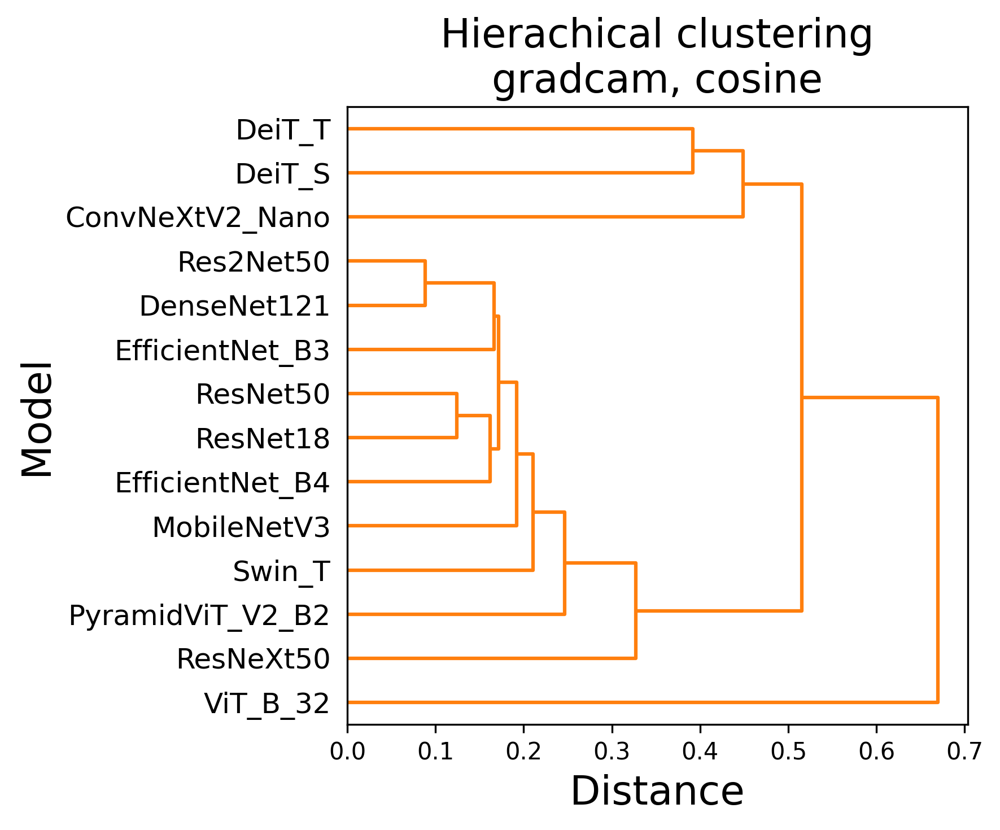

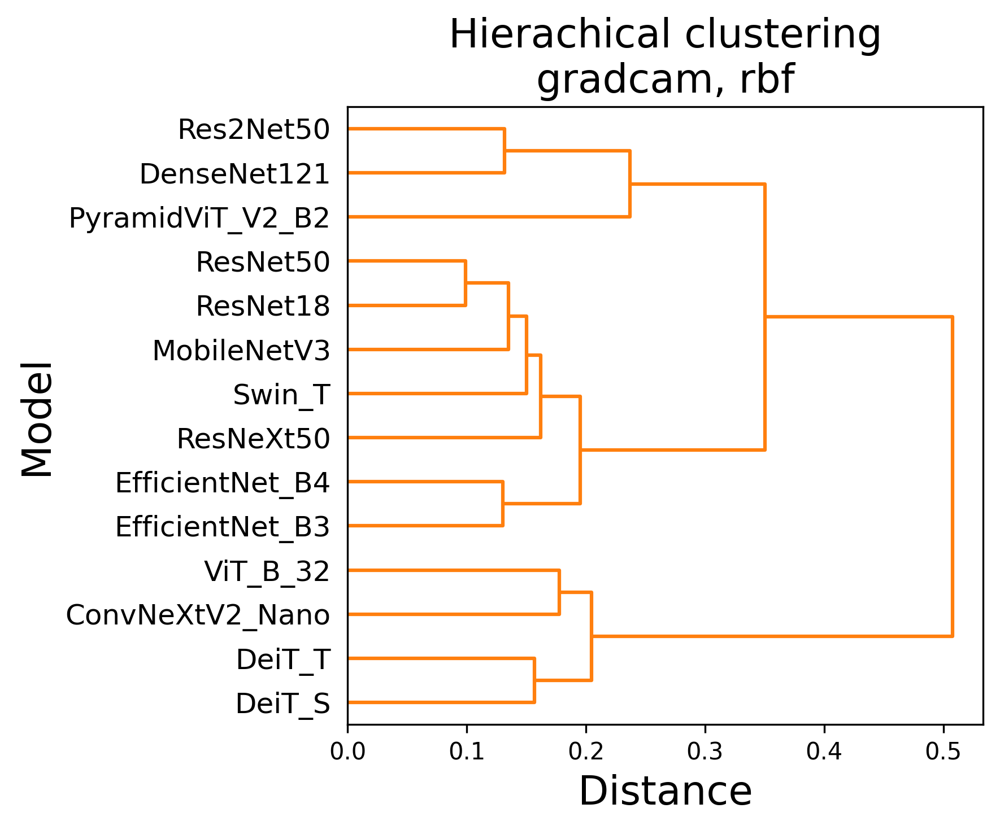

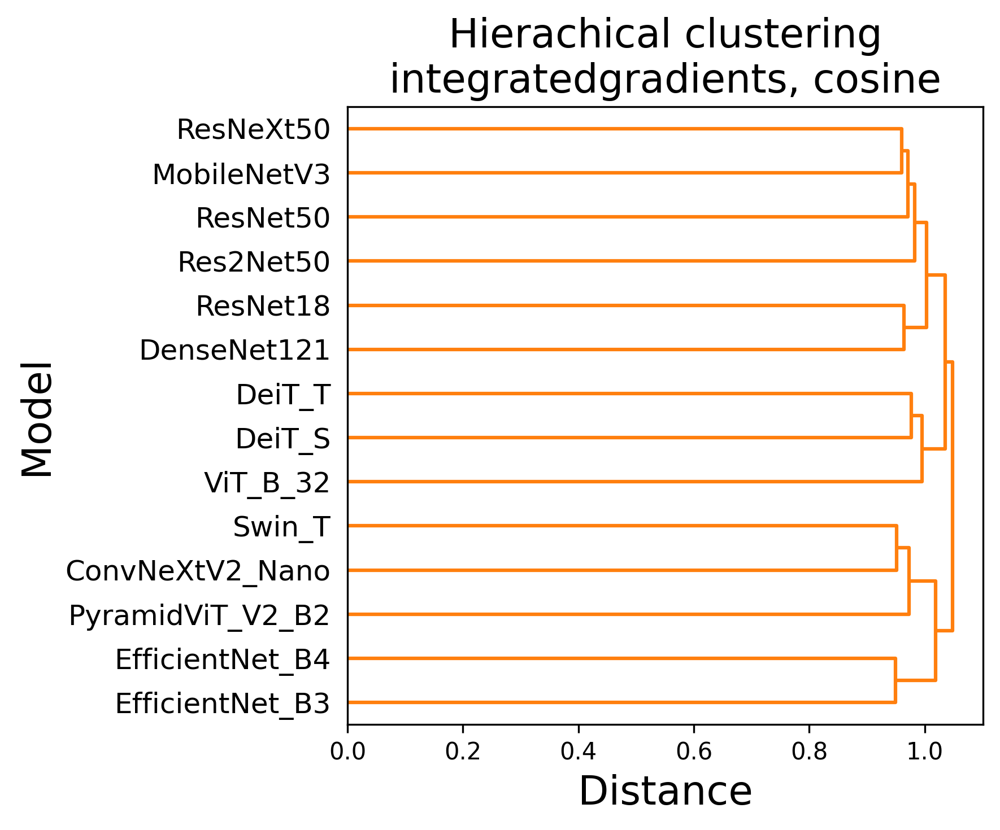

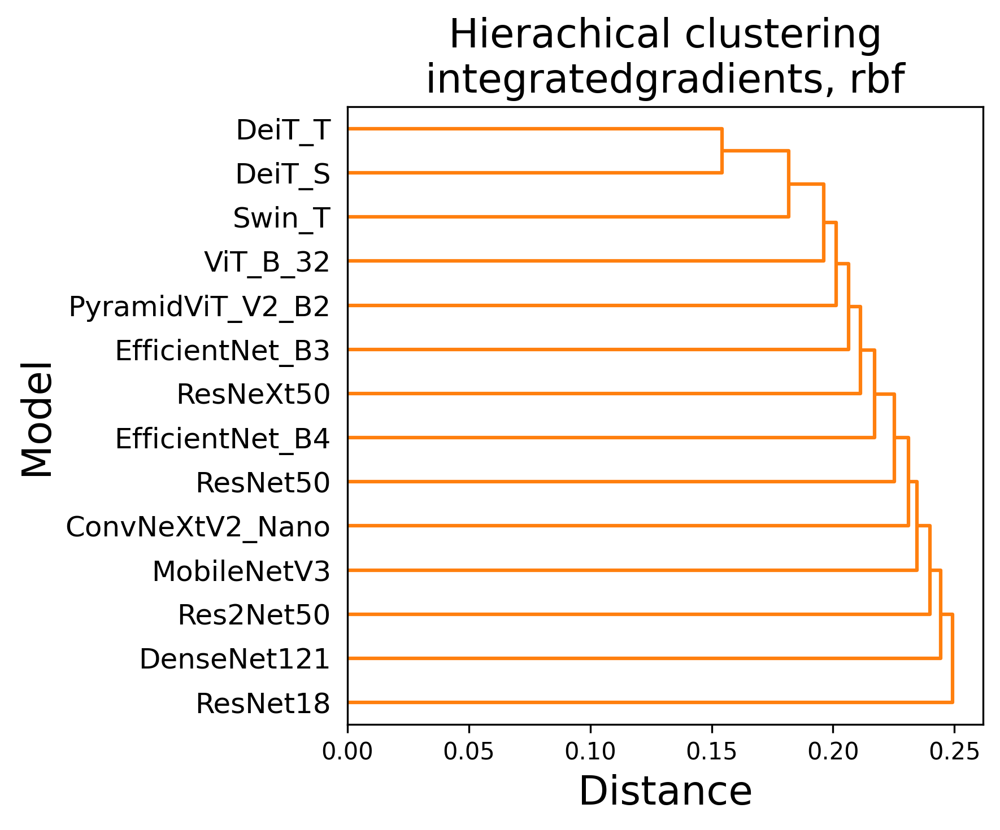

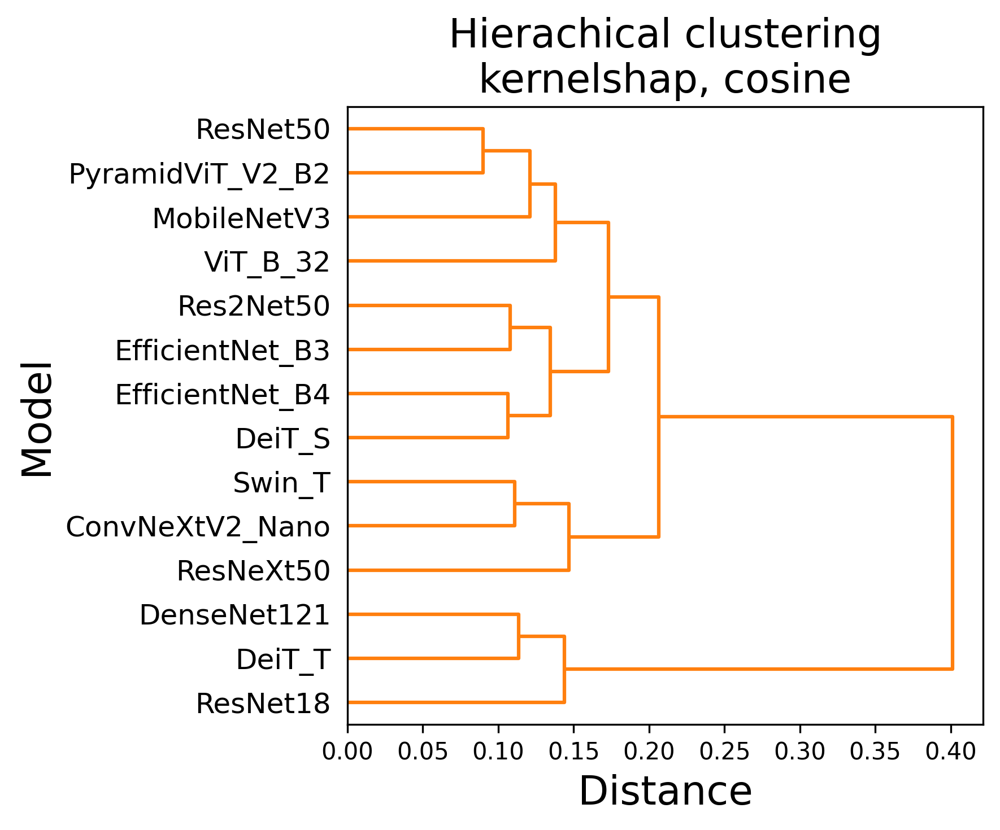

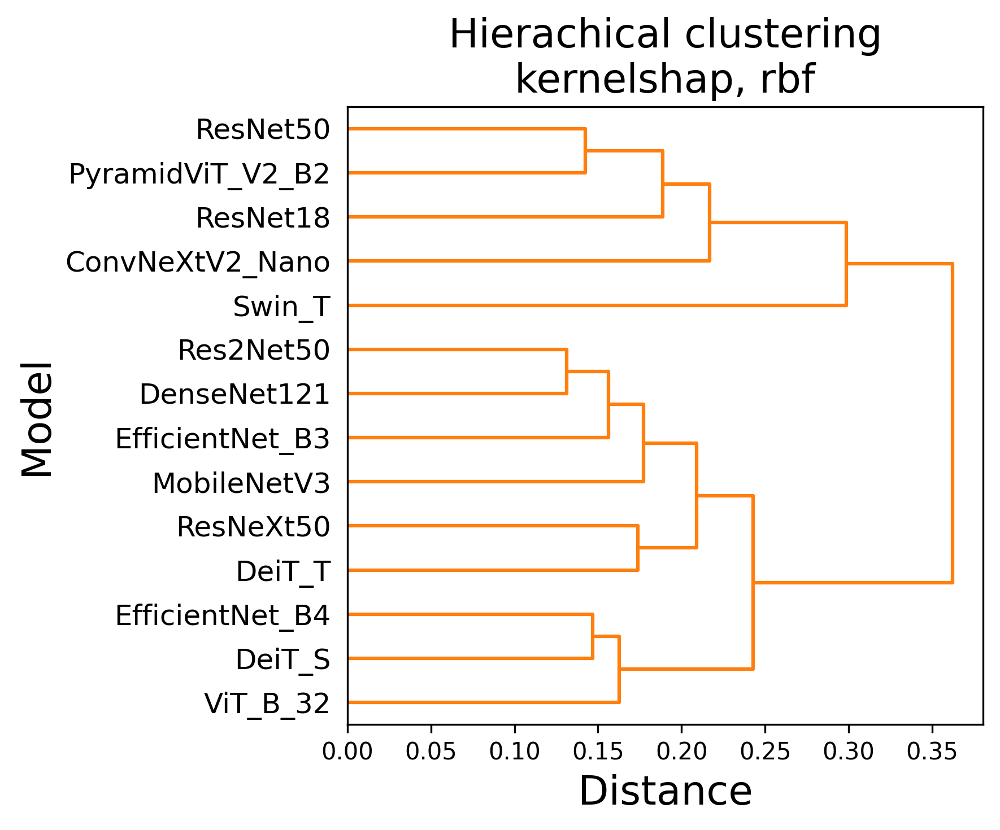

In [42]:
for csv_name in similarity_matriced_csvs:
    splitted = csv_name.split('_')
    explanation_method, similarity_metric = splitted[2], splitted[3].split('.')[0]
    title = f"Hierachical clustering\n{explanation_method}, {similarity_metric}"
    if "only_matching" in csv_name:
        title += ", only matching predictions"
        output_filename = f'dendrogram_hierarchical_{explanation_method}_{similarity_metric}_only_matching.png'
    else:
        output_filename = f'dendrogram_hierarchical_{explanation_method}_{similarity_metric}_all.png'

    # loaded as dissimilarity, so we invert it to similarity by substracting it from 1
    df = 1-pd.read_csv(csv_name, index_col=0)
    np.fill_diagonal(df.values, 1)
    Z, clusters = hierarchical_clustering(df, title=title, output_filename=output_filename, color_threshold=2) # 2 makes all same color